<a href="https://colab.research.google.com/github/slizer432/PCVK_Ganjil_2025/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [20]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import sys

 Mengubah tingkat kecerahan citra
---------------------------------
Masukkan nilai kecerahan: 100


/tmp/ipython-input-3313462888.py:15: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


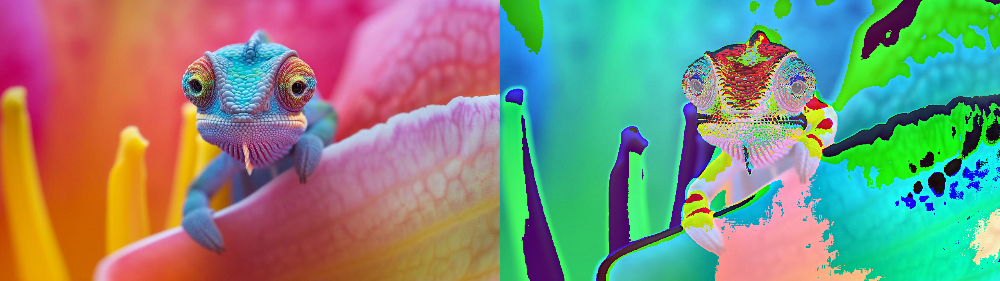

In [25]:
print(' Mengubah tingkat kecerahan citra')
print('---------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/Week 3/image.jpg')
brightness_image = np.zeros(original.shape, original.dtype)

# akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

# cara simpel tanpa for loop
# brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

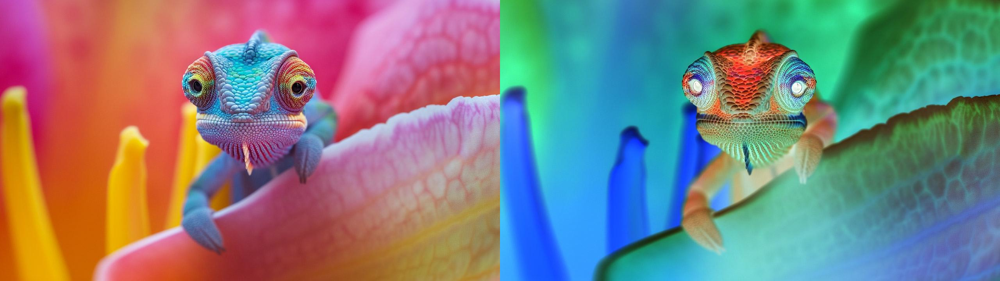

In [13]:
original_inverse = cv.imread('/content/drive/MyDrive/PCVK/Week 3/image.jpg')

inverse_image = 255 - original_inverse

final_frame_inverse = cv.hconcat((original_inverse, inverse_image))
cv2_imshow(final_frame_inverse)

Masukkan tingkat kecerahan [-255 - 255]: 100
Masukkan nilai kontras [1.0 - 3.0]: 1.5


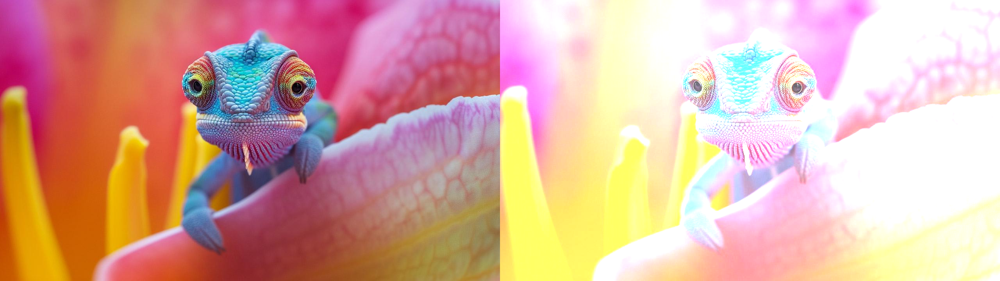

In [26]:
original_image = cv.imread('/content/drive/MyDrive/PCVK/Week 3/image.jpg')

try:
  brightness_input = float(input('Masukkan tingkat kecerahan [-255 - 255]: '))
  if not (-255 <= brightness_input <= 255):
    raise ValueError("Error, input out of bound")
    sys.exit(1)
except ValueError:
  print('Error, not a number')
  sys.exit(1)

try:
  contrast_input = float(input('Masukkan nilai kontras [1.0 - 3.0]: '))
  if not (1.0 <= contrast_input <= 3.0):
    raise ValueError("Error, input out of bound")
    sys.exit(1)
except ValueError:
  print('Error, not a number')
  sys.exit(1)

output_image = cv.convertScaleAbs(original_image, alpha=contrast_input, beta=brightness_input)

final_frame_contrast = cv.hconcat((original_image, output_image))
cv2_imshow(final_frame_contrast)

 Mengubah tingkat kecerahan citra dengan transformasi log
---------------------------------------------------------
Masukkan nilai kecerahan: 40


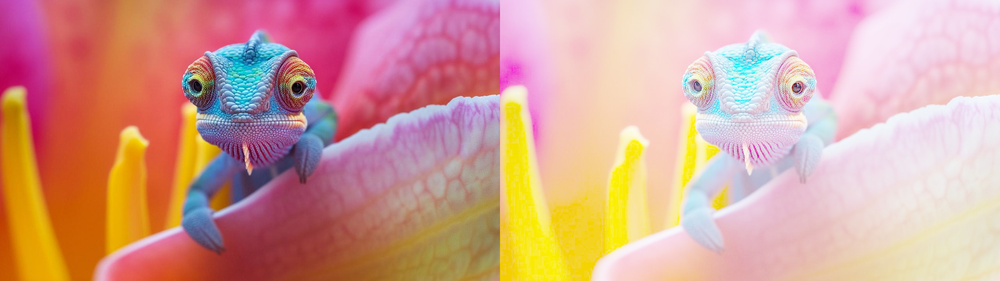

In [28]:
print(' Mengubah tingkat kecerahan citra dengan transformasi log')
print('---------------------------------------------------------')

try:
  c = float(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

image_float = original_image.astype(np.float128)

c = 255 / np.log(1 + np.max(image_float))

log_image = c * np.log(1 + image_float)

log_image = np.array(log_image, dtype = np.uint8)

final_frame_log = cv.hconcat((original_image, log_image))
cv2_imshow(final_frame_log)

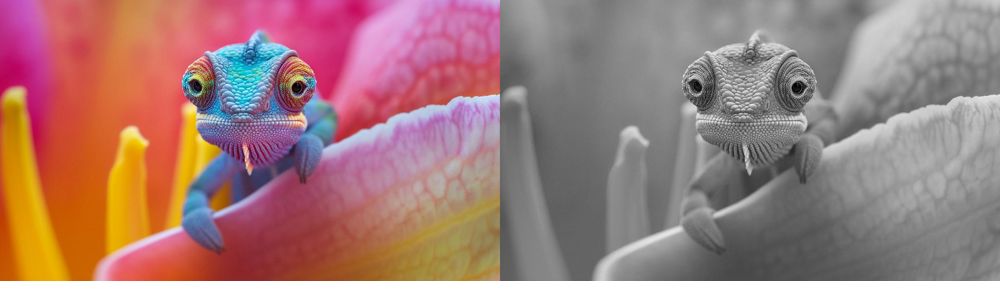

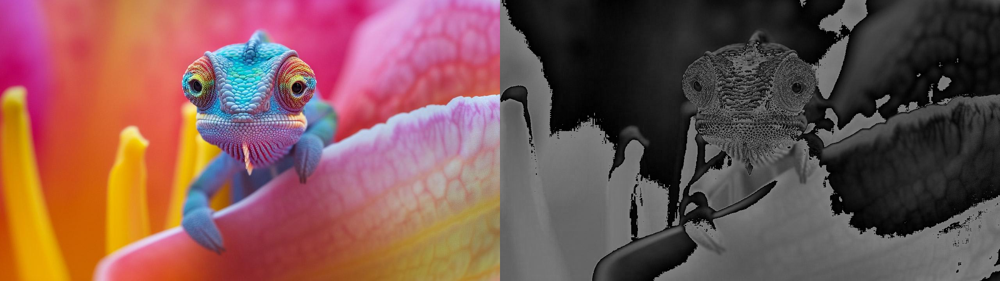

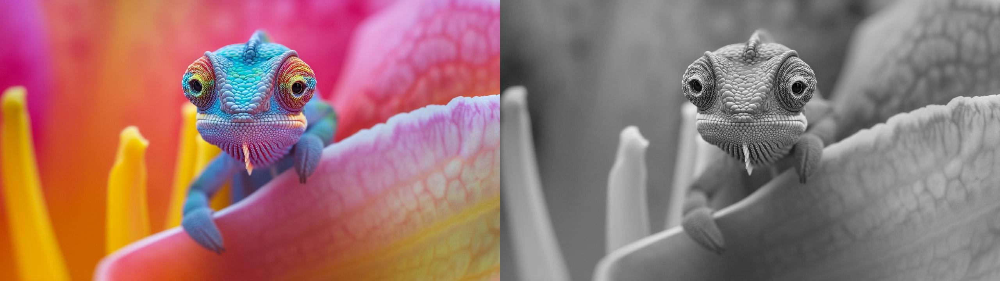

In [36]:
B, G, R = cv.split(original_image)

# 1. Gray Average
gray_avg = ((R.astype(np.float32) + G + B) / 3).astype(np.uint8)
gray_avg_bgr = cv.cvtColor(gray_avg, cv.COLOR_GRAY2BGR)


final_frame_gray = cv.hconcat([original_image, gray_avg_bgr])
cv2_imshow(final_frame_gray)

#2. Lightness method
gray_lightness = ((np.maximum(np.maximum(R, G), B) +
                   np.minimum(np.minimum(R, G), B)) / 2).astype(np.uint8)
gray_lightness_bgr = cv.cvtColor(gray_lightness, cv.COLOR_GRAY2BGR)


final_frame_lightness = cv.hconcat([original_image, gray_lightness_bgr])
cv2_imshow(final_frame_lightness)

# 3. Luminance method
gray_luminance = (.21 * R + 0.72 * G + 0.07 * B).astype(np.uint8)
gray_luminance_bgr = cv.cvtColor(gray_luminance, cv.COLOR_GRAY2BGR)


final_frame_luminance = cv.hconcat([original_image, gray_luminance_bgr])
cv2_imshow(final_frame_luminance)

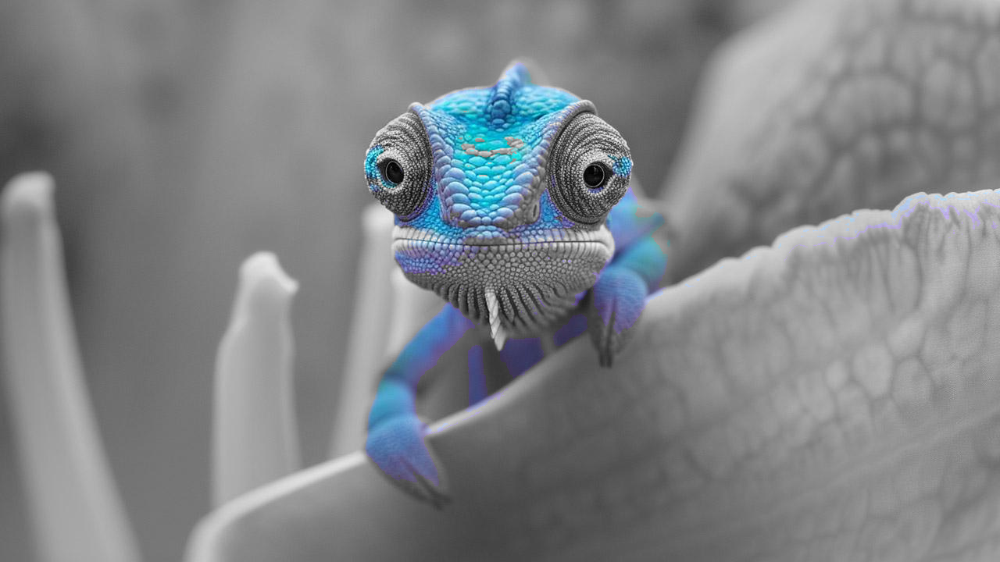

In [40]:
# Convert to grayscale
gray = cv.cvtColor(original_image, cv.COLOR_BGR2GRAY)
gray_bgr = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

# Convert to HSV
hsv = cv.cvtColor(original_image, cv.COLOR_BGR2HSV)

# Define range for blue color in HSV
lower_blue = np.array([90, 50, 50])   # lower bound
upper_blue = np.array([130, 255, 255]) # upper bound

# Create mask
mask = cv.inRange(hsv, lower_blue, upper_blue)

# Extract blue parts and combine with grayscale
color_part = cv.bitwise_and(original_image, original_image, mask=mask)
gray_part = cv.bitwise_and(gray_bgr, gray_bgr, mask=cv.bitwise_not(mask))
final_image = cv.add(color_part, gray_part)

# Show result
cv2_imshow(final_image)